# Star Trail: Center Finder

Code based on: 
- Astride: https://github.com/dwkim78/ASTRiDE#4-how-to-use-astride
- Circle-Fit: https://pypi.org/project/circle-fit/

In [1]:
from __future__ import print_function, unicode_literals, absolute_import, division
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
from helper import read_image, display, apply_filter

In [3]:
# !pip install git+https://github.com/dwkim78/ASTRiDE

In [4]:
# !pip install circle-fit

## Load Image

In [26]:
# Load Image
code = 102
fname = 'coadds/GenericCamera%i-20230309-images1352-1512-coadd.fits'%code
img = read_image(fname)

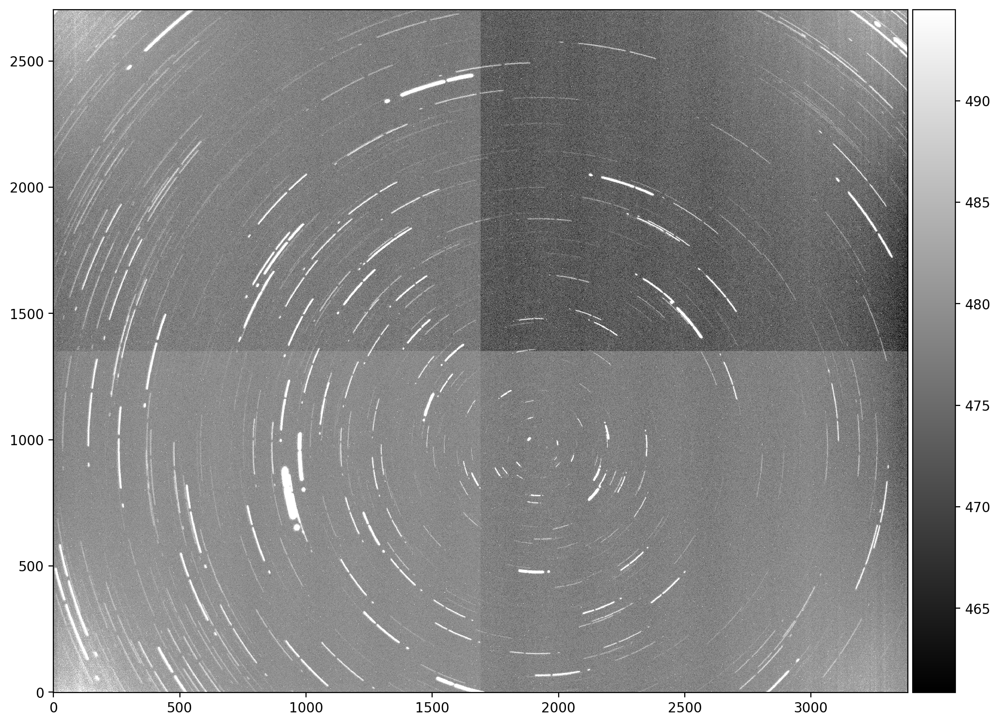

In [27]:
fig, (ax1) = plt.subplots(1,1, figsize=(12,12), sharex='all', sharey='all')
display(img,ax=ax1)
fig.savefig('star_trail_centroid_raw_%i.png'%code, dpi=120)

## Star Trail Arcs Selection

I choose the biggest arcs. The selection is perfomed by taking the largest perimeters.

In [28]:
# Import the ASTRiDE library.
from astride import Streak

# Read a fits image and create a Streak instance.
streak = Streak(fname, contour_threshold=1.5, area_cut=25, radius_dev_cut=0.5,remove_bkg='map', output_path='./')

# streak.raw_image = img

# Detect streaks.
streak.detect()

In [29]:
df = pd.DataFrame(streak.streaks)
df = df.sort_values(by='perimeter', ascending=False)

In [30]:
# only the 100 first largest arcs
selection = df.index.to_numpy()[:]
df[:5]

,index,x,y,x_center,y_center,perimeter,area,shape_factor,radius_deviation,slope,intercept,connectivity,x_min,x_max,y_min,y_max,box_plotted,slope_angle
285,286,"[2337.0, 2336.0, 2335.0, 2334.0, 2333.53390359...","[1642.8797081242685, 1642.599614159063, 1642.4...",2467.589575,1518.023680,2236.772643,5324.782525,0.013374,0.696175,-1.004965,3993.670447,-1,2328.200620,2574.316613,1396.420886,1642.879708,False,-45.141890
56,57,"[17.0, 16.0, 15.833741531893377, 16.0, 17.0, 1...","[687.7521020013817, 687.1667239728129, 687.0, ...",73.838338,411.744301,1840.583365,7442.916413,0.027608,0.556939,-3.547894,677.449611,-1,15.716981,145.080166,218.727003,687.752102,False,-74.259121
352,353,"[498.0, 497.0, 496.0, 495.0, 494.0, 493.850349...","[2079.1406600892046, 2079.05708750044, 2079.57...",379.741507,1908.807236,1771.530774,4672.650392,0.018710,0.648873,1.614068,1295.791045,-1,241.532500,504.318747,1658.865346,2079.572032,False,58.219608
139,140,"[371.0, 370.0, 369.8427740743233, 370.0, 370.1...","[1067.2260831911951, 1067.2344992731244, 1067....",380.193275,826.745763,1411.696866,3535.684503,0.022295,0.558955,-8.280190,3989.364144,-1,361.884706,416.100866,608.797377,1067.234499,False,-83.113729
244,245,"[327.0, 326.0, 325.0, 324.33999600037913, 324....","[1577.2602010628286, 1577.2300440162815, 1577....",265.829348,1366.069998,1284.346656,3768.273190,0.028707,0.555214,4.077957,282.662288,-1,222.865002,327.825993,1167.900742,1577.824853,False,76.221763


In [31]:
# len(edges)

In [32]:
edges = streak.streaks
edges_sel = [edges[ix] for ix in selection]

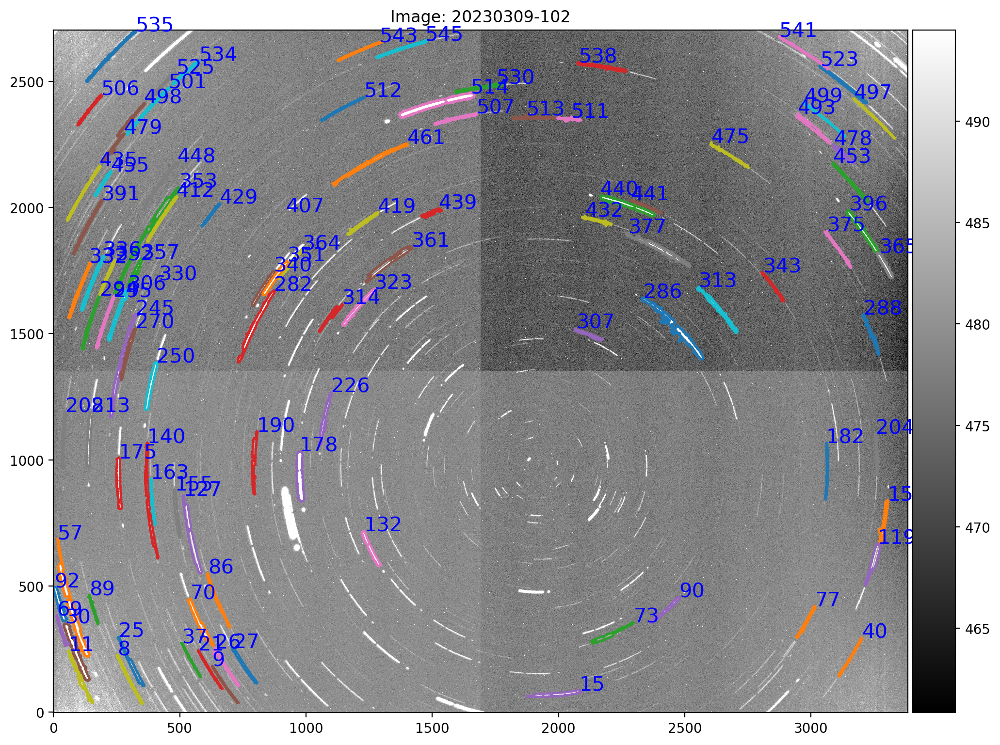

In [33]:
fig, (ax1) = plt.subplots(1,1, figsize=(12,12), sharex='all', sharey='all')

edges = streak.streaks
# Plot all contours.
for n in selection[:100]:
    edge = edges[n]
    ax1.plot(edge['x'], edge['y'],mfc='o',mec='r',ms=5)
    ax1.text(edge['x'][0], edge['y'][1],
            '%d' % (edge['index']), color='b', fontsize=15)

ax1.set_title('Image: 20230309-%i'%code)
display(img, ax=ax1)
fig.savefig('star_trail_centroid_trails_%i.png'%code, dpi=120)
# plt.plot(df.x_center, df.y_center, 'ro')

## Fitting a circle

The numerical problem of fitting a circle is more intricated than I assumed. I implemented some, but they don't awalys converge. After reading this paper:https://arxiv.org/abs/cs/0301001. I understood better the fails. However my time to making my algorithms work was short, so I decided to follow this package below which impelement several methods that I would like to implement myself. 

Implements most of the solutions discussed in the paper above. \
Circle-fit: https://pypi.org/project/circle-fit/



circle-fit methods options are:
```
- hyperLSQ()      : Least squares circle fit with "hyperaccuracy" by Kenichi Kanatani, Prasanna Rangarajan
- standardLSQ()   : Least squares circle fit, standard version.
- riemannSWFLa()  : Riemann circle fit, SWFL version A
- lm()            : Levenberg-Marquardt in the full (a,b,R) parameter space
- prattSVD()      : Algebraic circle fit by V. Pratt
- taubinSVD()     : Algebraic circle fit by G. Taubin
- hyperSVD()      : Algebraic circle fit with "hyperaccuracy"
- kmh()           : Consistent circle fit by A. Kukush, I. Markovsky, S. Van Huffel
```

I only used the Taubin and it didn't fail for the arcs I used.

In [51]:
from circle_fit import prattSVD, taubinSVD

In [52]:
out = np.empty((len(edges_sel),4), dtype=float)

x = np.empty((0,),dtype=float)
y = np.empty((0,),dtype=float)
c = np.empty((0,),dtype=int)

for ix in range(len(edges_sel)):
    xi, yi = edges_sel[ix]['x'].astype(int), edges_sel[ix]['y'].astype(int)
    points = np.vstack([xi, yi]).T
    xc, yc, r, sigma = taubinSVD(points)
    out[ix] = np.array([xc, yc, r, sigma])
    
    x = np.append(x, xi)
    y = np.append(y, yi)
    c = np.append(c, ix*np.ones_like(xi))

In [53]:
# mean solution
xc_mean, yc_mean, r0m, sigma = np.nanmedian(out, axis=0)
R0 = np.hypot(x-xc_mean, y-yc_mean)
print(xc_mean, yc_mean)

1788.7791835621483 1044.1041860175083


In [55]:
for i in range(3):
    R0 = np.hypot(x-xc_mean, y-yc_mean)
    _, ixs = np.unique(c, return_index=True)

    outer = R0[ixs]>1000
    inner = R0[ixs]<500
    # bad = (np.abs(out[:,0]-xc_mean)>100)|(np.abs(out[:,1]-yc_mean)>100)
    xco, yco, r0m, sigma = np.nanmedian(out[outer,:], axis=0)
    xci, yci, r0m, sigma = np.nanmedian(out[inner,:], axis=0)
    
    xc_mean, yc_mean = xci, yci
print("Outer points solution: %i, %i"%(xco, yco))
print("Inner points solution: %i, %i"%(xci, yci))

Outer points solution: 1626, 1153
Inner points solution: 1913, 950


In [56]:
print('I use the inner points')
xc_mean, yc_mean = xci, yci

I use the inner points


In [57]:
# unitary vector
R0 = np.hypot(x-xc_mean, y-yc_mean)
xu, yu = xc_mean+1*(1.*x-1.*xc_mean)/(1.*R0),  yc_mean+1*(y-yc_mean)/R0


### Checking

Plot the unitary circle to check the solution. If there's an ellipsoid, the current solution should be far from ideal.

In [58]:
# plt.figure(figsize=(6,4))
# plt.plot(xc_mean,yc_mean, 'ro',mfc='none', ms=20,mec='k',label='Center = (%i, %i)'%(xc_mean,yc_mean))
# plt.scatter(xu, yu, c=c, cmap='tab20')
# plt.title(r'Unitary Circle $\times 100$',fontsize=20)
# plt.legend(loc=3, fontsize=14)
# plt.gca().set_aspect('equal')

## Visualize the Results

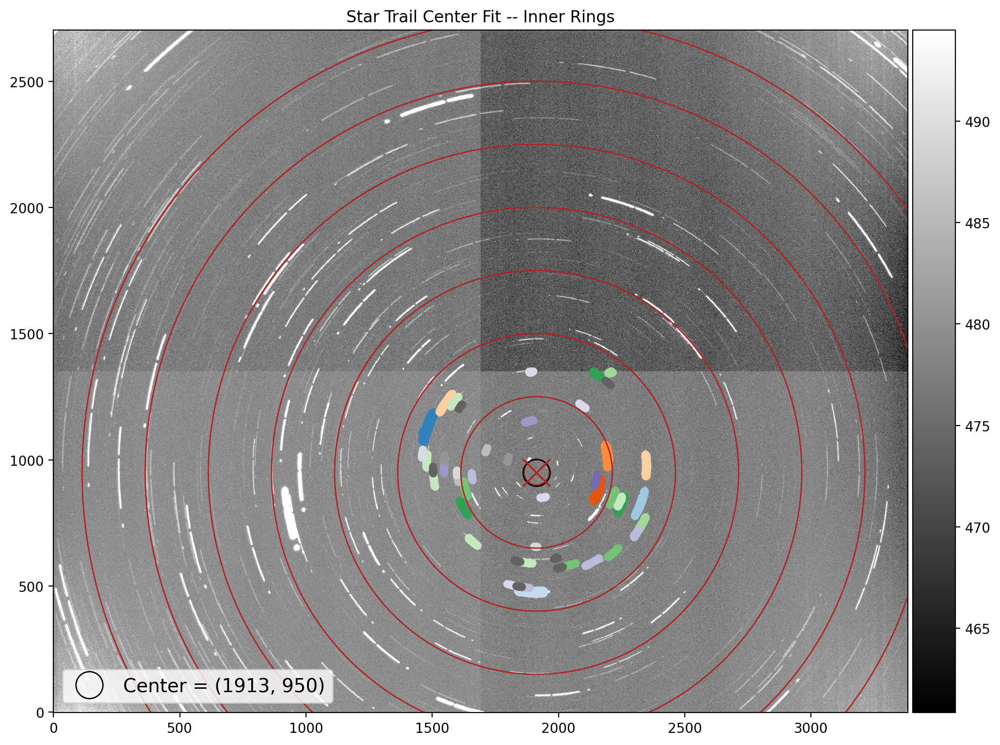

In [59]:
from matplotlib.patches import Circle
fig, (ax1) = plt.subplots(1,1, figsize=(12,12), sharex='all', sharey='all')

inner = R0 < 500

ax1.plot(xc_mean,yc_mean,'ro',mfc='none',mec='k',ms=20,label='Center = (%i, %i)'%(xc_mean,yc_mean))
ax1.scatter(x[inner][::2], y[inner][::2], c=c[inner][::2], s=20, cmap='tab20c', alpha=0.5)

ax1.legend(loc=3, fontsize=14)
for _ in np.arange(50, 2000, 250):
    plt.gca().add_patch(Circle((xc_mean,yc_mean), _, color='firebrick', ls='-', fc='none'))
    ax1.plot(xc_mean,yc_mean,'rx',mec='firebrick',ms=20,label='Center')

ax1.set_title('Star Trail Center Fit -- Inner Rings')
display(img,ax=ax1)
fig.tight_layout()
fig.savefig('star_trail_centroid_%i.png'%code, dpi=120)

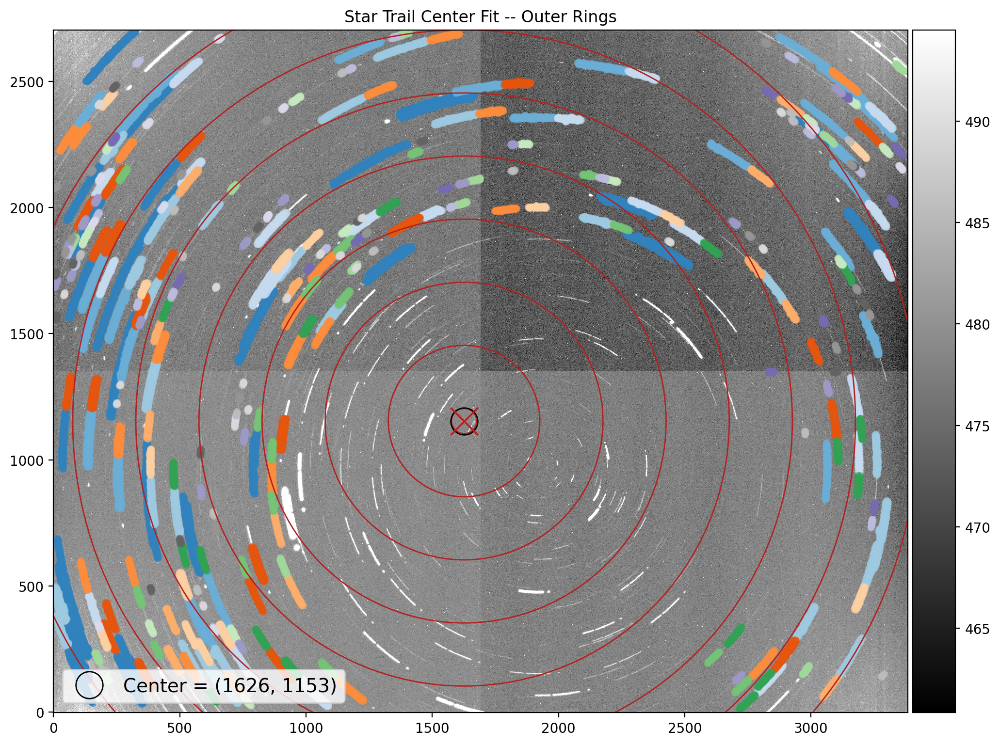

In [60]:
from matplotlib.patches import Circle
fig, (ax1) = plt.subplots(1,1, figsize=(12,12), sharex='all', sharey='all')

# inner = R0 < 300
inner = R0 > 1000
xc_mean, yc_mean = xco, yco

ax1.plot(xc_mean,yc_mean,'ro',mfc='none',mec='k',ms=20,label='Center = (%i, %i)'%(xc_mean,yc_mean))
ax1.scatter(x[inner][::10], y[inner][::10], c=c[inner][::10], s=20, cmap='tab20c', alpha=0.5)

ax1.legend(loc=3, fontsize=14)
for _ in np.arange(50, 2000, 250):
    plt.gca().add_patch(Circle((xc_mean,yc_mean), _, color='firebrick', ls='-', fc='none'))
    ax1.plot(xc_mean,yc_mean,'rx',mec='firebrick',ms=20,label='Center')

ax1.set_title('Star Trail Center Fit -- Outer Rings')
display(img,ax=ax1)
fig.tight_layout()
fig.savefig('star_trail_centroid_outer_%i.png'%code, dpi=120)

I need to flag the bad fits!

## To Dos
- Flag the bad fits
- Estimate the error
- Check other fiting circle methods

In [97]:
# np.count_nonzero(~filter_out)

100

In [93]:
from circle_fit import hyperLSQ, standardLSQ, riemannSWFLa, lm
from circle_fit import prattSVD, taubinSVD, hyperSVD, kmh

methods = {
    "hyperLSQ": hyperLSQ,
    "standardLSQ": standardLSQ,
    "riemannSWFLa": riemannSWFLa,
    "lm": lm,
    "prattSVD": prattSVD,
    "taubinSVD": taubinSVD,
    "hyperSVD": hyperSVD,
    "kmh": kmh
}

In [ ]:
def fit_arcs():
    out = np.empty((len(edges_sel),4), dtype=float)
    for ix in range(len(edges_sel)):
        xi, yi = edges_sel[ix]['x'].astype(int), edges_sel[ix]['y'].astype(int)
        points = np.vstack([xi, yi]).T
        xc, yc, r, sigma = taubinSVD(points)
        out[ix] = np.array([xc, yc, r, sigma])


# Other Image - Narrow Field I Think

In [61]:
# Load Image
code = 103
fname = 'coadds/GenericCamera%i-20230309-images1352-1512-coadd.fits'%code
img = read_image(fname)

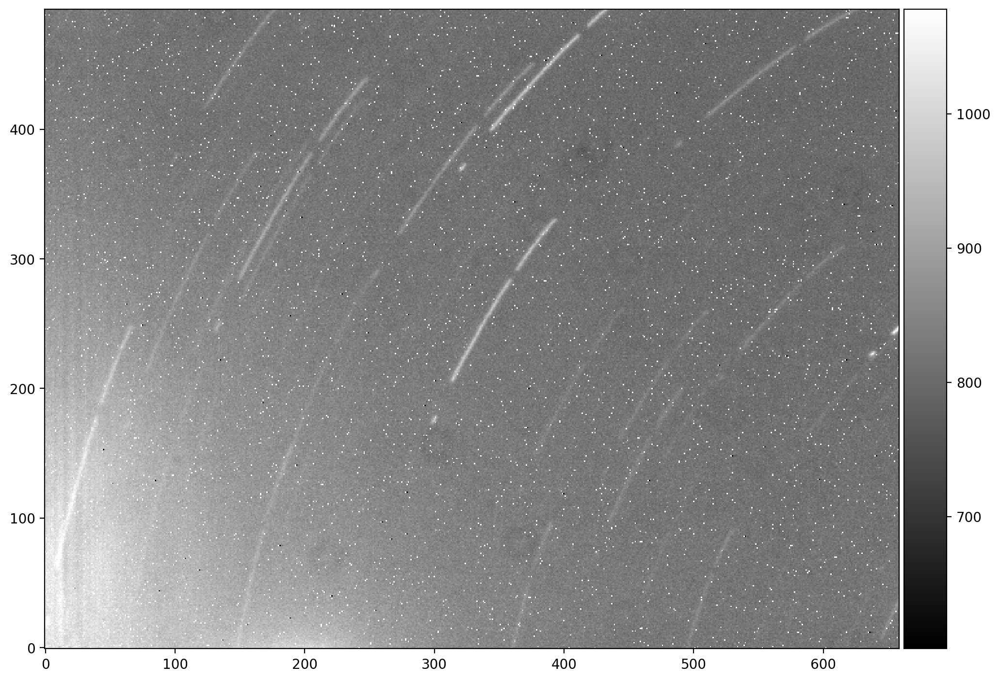

In [62]:
fig, (ax1) = plt.subplots(1,1, figsize=(12,12), sharex='all', sharey='all')
display(img,ax=ax1)
fig.savefig('star_trail_centroid_raw_%i.png'%code, dpi=120)

## Star Trail Arcs Selection

I choose the biggest arcs. The selection is perfomed by taking the largest perimeters.

In [124]:
# Import the ASTRiDE library.
from astride import Streak

# Read a fits image and create a Streak instance.
streak = Streak(fname, contour_threshold=1.25, area_cut=25, radius_dev_cut=0.5,remove_bkg='map', output_path='./')

# streak.raw_image = img

# Detect streaks.
streak.detect()

In [125]:
df = pd.DataFrame(streak.streaks)
df = df.sort_values(by='perimeter', ascending=False)

In [126]:
# only the 100 first largest arcs
selection = df.index.to_numpy()[:]
df[:5]

,index,x,y,x_center,y_center,perimeter,area,shape_factor,radius_deviation,slope,intercept,connectivity,x_min,x_max,y_min,y_max,box_plotted,slope_angle
17,18,"[206.0, 205.77067167048537, 205.0, 204.2941350...","[383.220266962097, 383.0, 382.655390408507, 38...",175.495865,333.062905,458.208324,616.848371,0.036920,0.605530,1.593003,55.710756,-1,146.650912,207.256033,283.166550,383.248942,False,57.881650
21,22,"[331.0, 330.8937671870555, 330.0, 329.88413985...","[405.1069993662204, 405.0, 404.14725381549084,...",302.350661,361.962933,338.763875,443.164144,0.048527,0.518447,1.340926,-42.947282,-1,271.316134,333.943060,317.908410,405.106999,False,53.286153
26,27,"[578.0, 577.9137785611618, 578.0, 578.37582425...","[466.1120878704896, 466.0, 465.62637376503477,...",544.234583,437.624105,322.117421,427.266766,0.051746,0.521131,0.793652,6.057956,-1,508.286930,579.445055,405.952741,466.112088,False,38.437351
12,13,"[362.0, 361.93421824383876, 361.0, 360.0, 359....","[287.1071046758557, 287.0, 286.4812615847865, ...",334.938224,244.635864,319.519714,591.987376,0.072866,0.584743,1.627886,-300.887723,-1,308.996747,362.495034,201.933742,287.107105,False,58.437864
25,26,"[411.0, 410.6728485279798, 410.0, 409.13921362...","[475.165203018115, 475.0, 474.82573351469324, ...",377.241599,436.835983,291.909099,620.332364,0.091483,0.546691,1.060082,37.223638,-1,340.741539,414.396332,396.597363,475.377678,False,46.670553


In [127]:
# len(edges)

In [128]:
edges = streak.streaks
edges_sel = [edges[ix] for ix in selection]

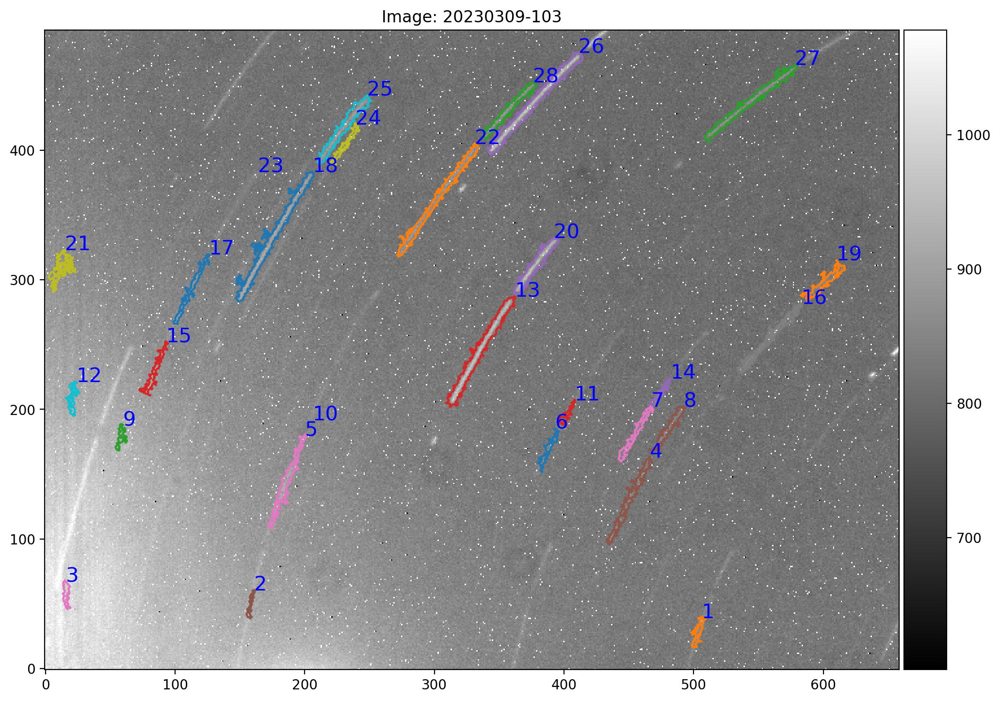

In [129]:
fig, (ax1) = plt.subplots(1,1, figsize=(12,12), sharex='all', sharey='all')

edges = streak.streaks
# Plot all contours.
for n in selection[:100]:
    edge = edges[n]
    ax1.plot(edge['x'], edge['y'],mfc='o',mec='r',ms=5)
    ax1.text(edge['x'][0], edge['y'][1],
            '%d' % (edge['index']), color='b', fontsize=15)

ax1.set_title('Image: 20230309-%i'%code)
display(img, ax=ax1)
fig.savefig('star_trail_centroid_trails_%i.png'%code, dpi=120)
# plt.plot(df.x_center, df.y_center, 'ro')

## Fitting a circle

The numerical problem of fitting a circle is more intricated than I assumed. I implemented some, but they don't awalys converge. After reading this paper:https://arxiv.org/abs/cs/0301001. I understood better the fails. However my time to making my algorithms work was short, so I decided to follow this package below which impelement several methods that I would like to implement myself. 

Implements most of the solutions discussed in the paper above. \
Circle-fit: https://pypi.org/project/circle-fit/



circle-fit methods options are:
```
- hyperLSQ()      : Least squares circle fit with "hyperaccuracy" by Kenichi Kanatani, Prasanna Rangarajan
- standardLSQ()   : Least squares circle fit, standard version.
- riemannSWFLa()  : Riemann circle fit, SWFL version A
- lm()            : Levenberg-Marquardt in the full (a,b,R) parameter space
- prattSVD()      : Algebraic circle fit by V. Pratt
- taubinSVD()     : Algebraic circle fit by G. Taubin
- hyperSVD()      : Algebraic circle fit with "hyperaccuracy"
- kmh()           : Consistent circle fit by A. Kukush, I. Markovsky, S. Van Huffel
```

I only used the Taubin and it didn't fail for the arcs I used.

In [130]:
from circle_fit import prattSVD, taubinSVD, hyperLSQ, kmh, lm

In [131]:
out = np.empty((len(edges_sel),4), dtype=float)

x = np.empty((0,),dtype=float)
y = np.empty((0,),dtype=float)
c = np.empty((0,),dtype=int)

for ix in range(len(edges_sel)):
    xi, yi = edges_sel[ix]['x'].astype(int), edges_sel[ix]['y'].astype(int)
    points = np.vstack([xi, yi]).T
    xc, yc, r, sigma = taubinSVD(points)
    out[ix] = np.array([xc, yc, r, sigma])
    
    x = np.append(x, xi)
    y = np.append(y, yi)
    c = np.append(c, ix*np.ones_like(xi))

In [132]:
# mean solution
xc_mean, yc_mean, r0m, sigma = np.nanmedian(out, axis=0)
R0 = np.hypot(x-xc_mean, y-yc_mean)
print(xc_mean, yc_mean)

444.0160787466044 151.00699548445655


In [133]:
out[:,0],out[:,1]

(array([ 6.12998164e+02,  3.47670240e+03,  1.30441722e+03,  7.00842935e+02,
         1.50305478e+03,  9.17732186e+02, -1.54031235e+03,  8.86108780e+02,
         9.43341914e+00,  3.84366476e+02,  4.91304530e+02,  5.42971813e+02,
         6.26540555e+02, -4.32777326e+02,  7.18859804e+02, -1.38367349e+02,
         1.08269298e+03,  3.32091495e+02, -5.43669407e-01,  5.13383505e+01,
         4.78490730e+02,  5.25997707e+02,  4.81000394e+01,  3.57456597e+02,
         4.09541427e+02,  2.10200701e+02,  2.85752518e+02,  1.92000723e+02]),
 array([   73.10081762, -1959.25393465,  -502.14410582,    30.73781908,
         -602.53148891,   -97.20083244,   770.66161691,   -49.62969057,
          307.80029104,   296.88505222,   108.3057278 ,   360.93010738,
          174.19676058,   444.54638364,    58.98342554,   611.8747639 ,
         -183.24446567,   257.02988967,   560.90619589,   205.23572663,
          127.81723039,    22.02317523,   179.63263911,   221.46549996,
          258.46972357,    41.2098

In [134]:
# unitary vector
R0 = np.hypot(x-xc_mean, y-yc_mean)
xu, yu = xc_mean+1*(1.*x-1.*xc_mean)/(1.*R0),  yc_mean+1*(y-yc_mean)/R0


### Checking

Plot the unitary circle to check the solution. If there's an ellipsoid, the current solution should be far from ideal.

In [135]:
# plt.figure(figsize=(6,4))
# plt.plot(xc_mean,yc_mean, 'ro',mfc='none', ms=20,mec='k',label='Center = (%i, %i)'%(xc_mean,yc_mean))
# plt.scatter(xu, yu, c=c, cmap='tab20')
# plt.title(r'Unitary Circle $\times 100$',fontsize=20)
# plt.legend(loc=3, fontsize=14)
# plt.gca().set_aspect('equal')

## Visualize the Results

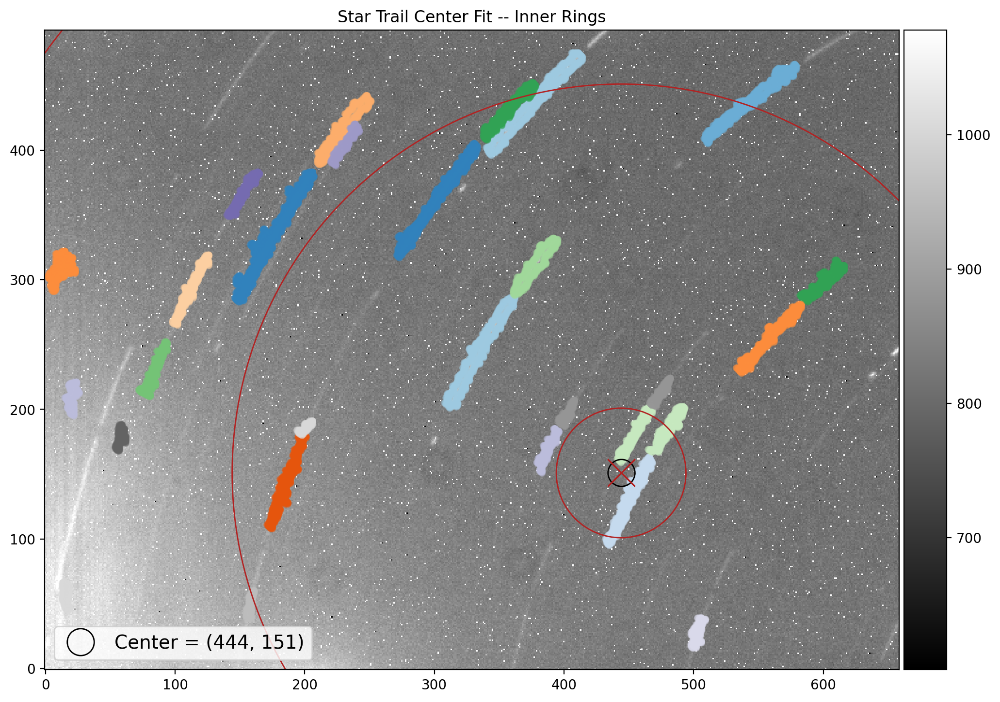

In [136]:
from matplotlib.patches import Circle
fig, (ax1) = plt.subplots(1,1, figsize=(12,12), sharex='all', sharey='all')

inner = R0 >0

ax1.plot(xc_mean,yc_mean,'ro',mfc='none',mec='k',ms=20,label='Center = (%i, %i)'%(xc_mean,yc_mean))
ax1.scatter(x, y, c=c, s=20, cmap='tab20c', alpha=0.5)

ax1.legend(loc=3, fontsize=14)
for _ in np.arange(50, 2000, 250):
    plt.gca().add_patch(Circle((xc_mean,yc_mean), _, color='firebrick', ls='-', fc='none'))
    ax1.plot(xc_mean,yc_mean,'rx',mec='firebrick',ms=20,label='Center')

ax1.set_title('Star Trail Center Fit -- Inner Rings')
display(img,ax=ax1)
fig.tight_layout()
fig.savefig('star_trail_centroid_%i.png'%code, dpi=120)

I need to flag the bad fits!

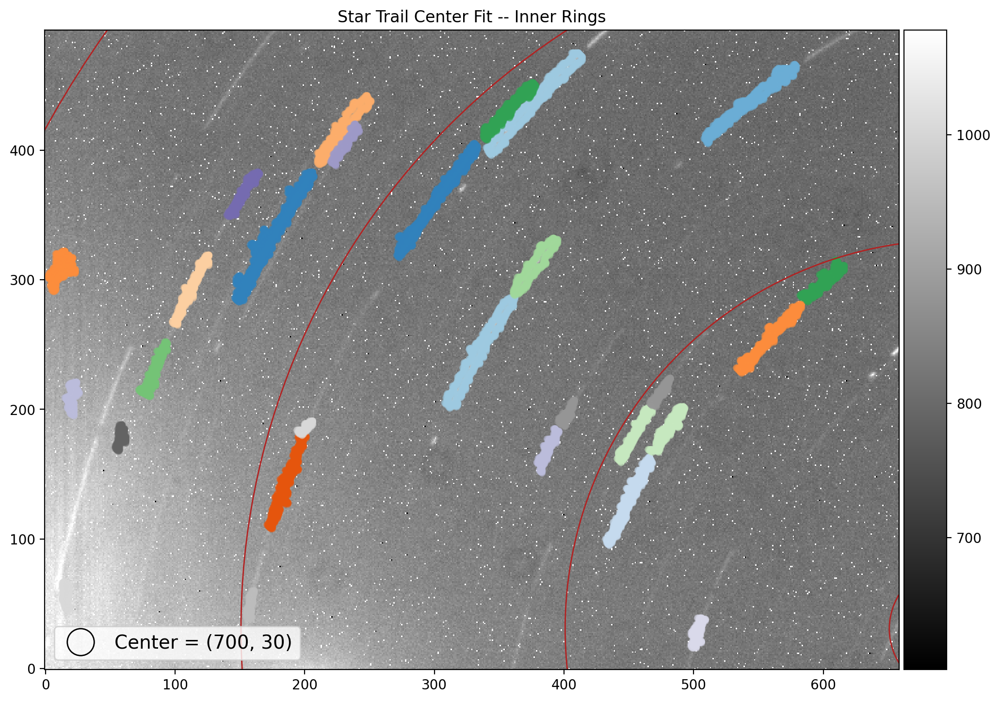

In [137]:
from matplotlib.patches import Circle
fig, (ax1) = plt.subplots(1,1, figsize=(12,12), sharex='all', sharey='all')

xc_mean, yc_mean, _, _ = out[3]

ax1.plot(xc_mean,yc_mean,'ro',mfc='none',mec='k',ms=20,label='Center = (%i, %i)'%(xc_mean,yc_mean))
ax1.scatter(x, y, c=c, s=20, cmap='tab20c', alpha=0.5)

ax1.legend(loc=3, fontsize=14)
for _ in np.arange(50, 2000, 250):
    plt.gca().add_patch(Circle((xc_mean,yc_mean), _, color='firebrick', ls='-', fc='none'))
    ax1.plot(xc_mean,yc_mean,'rx',mec='firebrick',ms=20,label='Center')

ax1.set_title('Star Trail Center Fit -- Inner Rings')
display(img,ax=ax1)
fig.tight_layout()
fig.savefig('star_trail_centroid_%i.png'%code, dpi=120)